# Сортировка пластиковых отходов

## Описание проекта

### Заказчик  
Renue — IT-компания из Екатеринбурга, специализирующаяся на разработке высоконагруженных и отказоустойчивых решений для бизнеса и государственных организаций.

### Работу выполнил  
Мельник Даниил Владимирович

---

### Описание  

#### Цель  
Разработать модель компьютерного зрения для детекции и классификации различных типов пластиковых отходов на изображениях, снятых с конвейерной ленты. Это решение автоматизирует процесс сортировки, повышая эффективность переработки и сокращая затраты на ручную работу.

#### Задачи  
1. Изучить предоставленный набор данных и подготовить его для обучения модели.  
2. Исследовать существующие решения для детекции объектов и выбрать подходящую модель.  
3. Обучить и протестировать модель, используя несколько подходов (включая предобученные модели).  
4. Провести анализ результатов и предложить возможные улучшения.  
5. Подготовить воспроизводимый код, подробную документацию и демонстрацию работы модели.

#### Формат проекта
Индивидуальное соревнование на платформе [Kaggle]('https://www.kaggle.com/competitions/waste-detection/leaderboard).  
**Основная метрика оценки** — **mean Average Precision (mAP)**, отражающая точность детекции объектов.  

Для оценки качества модели используется среднее взвешенное по классам (weighted mean by class support):  

Weighted mean$=\frac{\sum_{i=1}^{N} w_𝑖⋅𝑚𝐴𝑃_𝑖}{\sum_{i=1}^{N} w_𝑖}$

где:  
- $𝑚𝐴𝑃_i$ — значение каждого элемента,
- $w_i$ — вес (или поддержка) каждого элемента,
- $N$ — общее количество элементов.

---

### Данные  

**Описание набора данных**  
Заказчик предоставляет изображения отходов и их разметку.

**Файлы**  
- **images**: Папка с 9000 изображений. Каждое изображение — кадр с конвейера с отходами.  
- **train.csv**: Разметка для обучения модели. Поля:  
  - `file_name`: имя файла,  
  - `bbox`: рамка в формате [x_left, y_top, width, height],  
  - `category_id`: класс объекта.  
- **test.csv**: Файл с именами изображений для тестирования.  
- **sample_submission.csv**: Пример файла отправки решений. Поля:  
  - `file_name`: имя файла,  
  - `bbox`: список списков, формат каждого объекта: [class, confidence, x_left, y_top, width, height].

**Классы объектов**  
Набор включает 15 классов пластиковых отходов:  
1. PET (transparent) (green)  
2. PET (transparent) (brown)  
3. PET (transparent) (blue)  
4. PET (transparent)  
5. PET (transparent) (dark blue)  
6. PET (black)  
7. PET (white)  
8. PET (sticker)  
9. PET (flacon)  
10. PET (household chemicals)  
11. PND (household chemicals)  
12. PND packet  
13. Other plastic  
14. Other plastic (transparent)  
15. Not plastic  

**Формат изображений**  
- 9000 изображений в формате JPEG.  
- Размер изображения: 2048x1486 пикселей.  
- Камера над конвейерной лентой.  

---

### Технологический стек  
Python, NumPy, SciPy, PyTorch, OpenCV, Ultralytics  

---

### Импорт необходимых библиотек

In [ ]:
!pip install torch torchvision -q

In [ ]:
!pip install matplotlib -q

In [ ]:
!pip install opencv-python -q

In [ ]:
!pip install ultralytics -q

In [ ]:
!pip install clearml -q

In [ ]:
# Обновим библиотеку albumentations
!pip install albumentations -U -q

In [ ]:
# Основные библиотеки
import os
import sys
import random
import ast
import shutil
from collections import defaultdict

# Работа с данными
import pandas as pd
import numpy as np

# Визуализация
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageDraw
from IPython.display import Image as IPImage, display
import glob

# Работа с изображениями
import cv2

# Машинное обучение и глубокое обучение
import tensorflow as tf
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split, StratifiedGroupKFold
from ultralytics import YOLO

from albumentations.core.composition import OneOf

# Работа с файлами и конфигурациями
from shutil import copy
import yaml

In [ ]:
RANDOM_STATE = 42
CL_NAMES = {
    0: 'PET (transparent) (green)',
    1: 'PET (transparent) (brown)',
    2: 'PET (transparent) (blue)',
    3: 'PET (transparent)',
    4: 'PET (transparent) (dark blue)',
    5: 'PET (black)',
    6: 'PET (white)',
    7: 'PET (sticker)',
    8: 'PET (flacon)',
    9: 'PET (household chemicals)',
    10: 'PND (household chemicals)',
    11: 'PND packet',
    12: 'Other plastic',
    13: 'Other plastic (transparent)',
    14: 'Not plastic'
}
N_SPLITS = 5  # Количество фолдов

Проверим среду и назначим пути

In [ ]:
if 'COLAB_GPU' in os.environ:
    print('Код запущен в Google Colab')
    PATH = '/content/'
    PATH0 = PATH
    from google.colab import drive
    drive.mount('/content/drive')
    if not os.path.exists('images'):
        !unzip -q /content/drive/MyDrive/waste-detection.zip
elif 'KAGGLE_KERNEL_ID' in os.environ:
    print('Код запущен ва Kaggle')
    PATH0 = '/kaggle/input/waste-detection/'
    PATH = '/kaggle/working/'
else:
    print('Код запущен в другой среде')
    PATH = '/'

Код запущен в Google Colab


### Используемые функции

In [ ]:
def get_color_map(unique_categories):
    '''
    Создает словарь соответствия category_id и цвета.

    Параметры:
        unique_categories (list): Список уникальных категорий.

    Возвращает:
        dict: Словарь {category_id: цвет}.
    '''
    color_map = {}
    np.random.seed(42)  # Для воспроизводимости

    for category in unique_categories:
        color_map[category] = tuple(np.random.randint(0, 256, 3).tolist())  # RGB цвет

    return color_map

In [ ]:
def display_images(image_paths, annotations=None, grid_size=(3, 3), color_map=None, cli=-1):
    '''
    Функция для отображения изображений с аннотациями bbox и выделением классов цветами.

    Параметры:
        image_paths (list): Список путей к изображениям.
        annotations (dict): Словарь с аннотациями в формате {image_name: [(class_id, bbox)]}.
                            bbox - список [x_min, y_min, x_max, y_max] или [x, y, w, h].
        grid_size (tuple): Размерность сетки (строки, столбцы).
        color_map (dict): Словарь соответствия {class_id: (R, G, B)}.
    '''
    rows, cols = grid_size
    fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
    axes = axes.flatten()

    for i, image_path in enumerate(image_paths):
        if i >= rows * cols:
            break  # Ограничиваем количество отображаемых изображений

        ax = axes[i]

        # Проверяем существование изображения
        if not os.path.exists(image_path):
            ax.text(
                0.5, 0.5,
                'Изображение не найдено',
                color='red',
                ha='center',
                va='center'
            )
            ax.axis('off')
            continue

        # Загрузка изображения
        img = cv2.imread(image_path)
        if img is None:
            ax.text(
                0.5, 0.5,
                'Ошибка загрузки',
                color='red',
                ha='center',
                va='center'
            )
            ax.axis('off')
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Извлечение имени изображения
        image_name = os.path.basename(image_path)
        annotation = annotations.get(image_name, []) if annotations else []

        # Наносим рамки bbox
        for class_id, bbox in annotation:
            color = color_map.get(class_id, (255, 255, 255))  # Цвет для класса
            if len(bbox) == 4:
                x_min, y_min, x_max, y_max = bbox
                cv2.rectangle(
                    img,
                    (int(x_min), int(y_min)),
                    (int(x_max), int(y_max)),
                    color,
                    2
                )

                # Извлекаем название класса из списка CL_NAMES
                class_name = CL_NAMES[class_id + cli] if class_id - 1 < len(CL_NAMES) else f'Class {class_id - 1}'

                # Добавляем текст (название класса) над рамкой
                cv2.putText(
                    img,
                    class_name,
                    (int(x_min), int(y_min) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    1.5,
                    color,
                    2
                )

        # Отображение изображения
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(image_name)

    # Удаляем пустые графики
    for i in range(len(image_paths), rows * cols):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

In [ ]:
def safe_literal_eval(bbox_str):
    '''
    Функция для преобразования колонки bbox из строкового формата в список
    '''
    try:
        return ast.literal_eval(bbox_str)
    except (ValueError, SyntaxError):
        return None

In [ ]:
def prepare_yolo_format(data, images_folder, labels_folder, images_path):
    '''
    Подготавливает данные в формате YOLO

    Аргументы:
        data (pd.DataFrame): Датафрейм с колонками file_name, bbox, category_id.
        images_folder (str): Путь к папке, куда перемещаются изображения.
        labels_folder (str): Путь к папке, куда записываются файлы разметки.
        images_path (str): Базовый путь к изображениям.

    Возвращает:
        None. Файлы сохраняются в указанных папках.
    '''
    # Создание директорий, если их нет
    os.makedirs(images_folder, exist_ok=True)
    os.makedirs(labels_folder, exist_ok=True)

    def get_image_size(file_name):
        '''
        Извлекает размеры изображения (ширина, высота).

        Аргументы:
            file_name (str): Имя файла изображения.

        Возвращает:
            tuple: Ширина и высота изображения.
        '''
        with Image.open(os.path.join(images_path, file_name)) as img:
            return img.size

    # Обработка изображений и разметки
    for image_name in data['file_name'].unique():
        src_path = os.path.join(images_path, image_name)
        dest_path = os.path.join(images_folder, image_name)

        # Копирование изображения в папку
        shutil.copy(src_path, dest_path)

        # Подготовка пути для файла разметки
        label_path = os.path.join(
            labels_folder, f'{os.path.splitext(image_name)[0]}.txt'
        )

        # Фильтрация данных по текущему изображению
        image_data = data[data['file_name'] == image_name]

        # Получение размеров изображения
        width, height = get_image_size(image_name)

        annotations = []
        for _, row in image_data.iterrows():
            bbox = row['bbox']
            category_id = row['category_id']

            # Проверка корректности bbox и category_id
            if isinstance(bbox, list) and category_id > 0:
                x_min, y_min, box_width, box_height = bbox
                x_center = (x_min + box_width / 2) / width
                y_center = (y_min + box_height / 2) / height
                norm_width = box_width / width
                norm_height = box_height / height
                annotations.append(
                    f'{int(category_id) - 1} {x_center:.6f} {y_center:.6f} '
                    f'{norm_width:.6f} {norm_height:.6f}'
                )

        # Запись аннотаций в файл
        with open(label_path, 'w') as label_file:
            label_file.write('\n'.join(annotations))

    print(
        f'Обработка данных завершена. Файлы сохранены в {images_folder} и {labels_folder}.'
    )

In [ ]:
def yolo_to_annotations(labels_folder, images_folder, image_names):
    '''
    Преобразует аннотации из YOLO-формата в формат [x_min, y_min, x_max, y_max].

    Параметры:
        labels_folder (str): Путь к папке с файлами аннотаций YOLO.
        images_folder (str): Путь к папке с изображениями.
        image_names (list): Список имён файлов изображений.

    Возвращает:
        dict: Словарь аннотаций {image_name: [(class_id, [x_min, y_min, x_max, y_max])]}.
    '''
    annotations = {}
    for image_name in image_names:
        label_file = os.path.join(labels_folder, f'{os.path.splitext(image_name)[0]}.txt')
        image_path = os.path.join(images_folder, image_name)

        if not os.path.exists(label_file) or not os.path.exists(image_path):
            continue

        # Получаем размеры изображения
        with Image.open(image_path) as img:
            width, height = img.size

        with open(label_file, 'r') as file:
            bbox_data = file.readlines()

        bboxes = []
        for line in bbox_data:
            class_id, x_center, y_center, norm_width, norm_height = map(float, line.strip().split())
            x_center *= width
            y_center *= height
            bbox_width = norm_width * width
            bbox_height = norm_height * height
            x_min = x_center - bbox_width / 2
            y_min = y_center - bbox_height / 2
            x_max = x_center + bbox_width / 2
            y_max = y_center + bbox_height / 2
            bboxes.append((int(class_id), [x_min, y_min, x_max, y_max]))

        annotations[image_name] = bboxes

    return annotations

Проверим возможность подключения GPU

In [ ]:
print('GPU available:', tf.config.list_physical_devices('GPU'))

GPU available: []


In [ ]:
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA не доступна. Обучение будет выполняться на CPU.')
    device = 'cpu'
else:
    print('CUDA доступна! Обучение будет выполняться на GPU ...')
    device = 'cuda'

CUDA is not available.  Training on CPU ...


## Загрузка данных

Посмотрим содержание нашей папки

Считаем тренировочный и тестовый датасеты

In [ ]:
train_df = pd.read_csv(PATH0 + 'train.csv')
test_df = pd.read_csv(PATH0 + 'test.csv')

Проверим содержимое датасетов

In [ ]:
# Посмотрим первые несколько строк
train_df.head()

,file_name,bbox,category_id
0,000001.jpg,"[840.0, 0.0, 176.0, 124.0]",4.0
1,000001.jpg,"[612.0, 306.0, 383.0, 397.0]",2.0
2,000001.jpg,"[990.92, 551.0, 105.00000000000011, 186.0]",4.0
3,000002.jpg,"[1000.0, 614.0, 98.0, 178.0]",4.0
4,000002.jpg,"[605.0, 358.0, 402.0, 409.0]",2.0


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32265 entries, 0 to 32264
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   file_name    32265 non-null  object 
 1   bbox         32148 non-null  object 
 2   category_id  32148 non-null  float64
dtypes: float64(1), object(2)
memory usage: 756.3+ KB


В датасете присутствуют пропущенные данные в bbox и  category_id

## Анализ данных

### Визуализируем пример изображений без разметки

Глянем несколько файлов, для которых пропущенны значения

In [ ]:
image_dir = PATH0 + 'images/'

In [ ]:
# Отбираем данные с пропущенными bbox или category_id
missing_data = train_df[
    train_df['bbox'].isnull() | train_df['category_id'].isnull()
]

In [ ]:
# Устанавливаем random_state
random.seed(RANDOM_STATE)
# Определяем пути к изображениям
image_paths = [
    os.path.join(image_dir, file_name)
    for file_name in random.sample(list(missing_data['file_name']), 9)  # Выбираем 9 случайных изображений
]

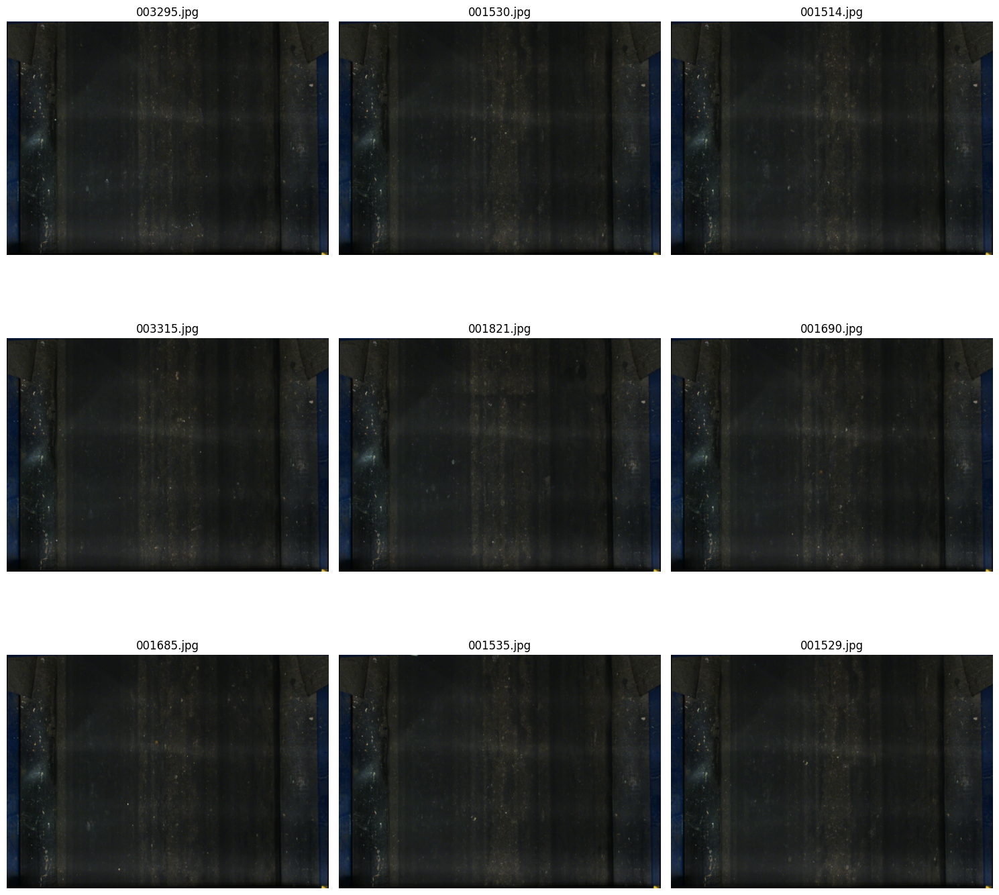

In [ ]:
# Визуализируем изображения
display_images(image_paths=image_paths)

На изображениях отсутствуют объекты для детекции

In [ ]:
test_df.head()

,file_name
0,000003.jpg
1,000006.jpg
2,000013.jpg
3,000016.jpg
4,000019.jpg


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2999 entries, 0 to 2998
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   file_name  2999 non-null   object
dtypes: object(1)
memory usage: 23.6+ KB


Преобразуем bbox в формат списка

In [ ]:
train_df['bbox'] = train_df['bbox'].apply(safe_literal_eval)

### Визуализируем пример изображений и разметки

Визуализируем пример изображений с разметкой

In [ ]:
# Извлекаем уникальные значения категорий (без NaN)
unique_categories = train_df['category_id'].dropna().unique()
# Генерируем цветовую карту для уникальных категорий
color_map = get_color_map(unique_categories)

In [ ]:
# Фильтруем строки с отсутствующими значениями в category_id
filtered_train_df = train_df.dropna(subset=['category_id'])

In [ ]:
# Извлекаем список уникальных имён файлов изображений
unique_images = filtered_train_df['file_name'].unique()

In [ ]:
# Формируем аннотации
annotations = {}
for _, row in filtered_train_df.iterrows():
    file_name = row['file_name']
    bbox = row['bbox']

    # Преобразуем [x, y, w, h] -> [x_min, y_min, x_max, y_max]
    bbox_converted = [
        bbox[0],
        bbox[1],
        bbox[0] + bbox[2],
        bbox[1] + bbox[3]
    ]
    category_id = row['category_id']

    if file_name not in annotations:
        annotations[file_name] = []
    annotations[file_name].append((category_id, bbox_converted))

In [ ]:
# Определяем пути к изображениям
image_paths = [
    os.path.join(image_dir, file_name)
    for file_name in random.sample(list(unique_images), 9)
]

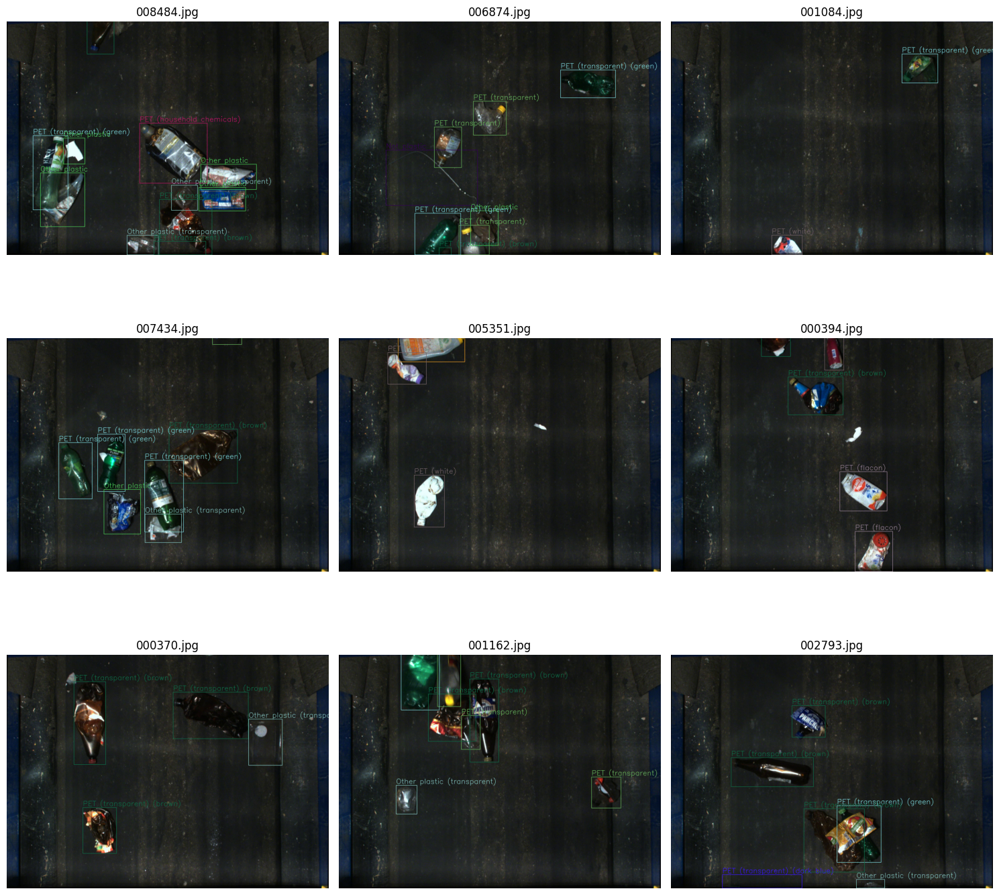

In [ ]:
# Отображение изображений с аннотациями
display_images(
    image_paths=image_paths,
    annotations=annotations,
    grid_size=(3, 3),
    color_map=color_map
)

### Проверим распределение классов, их пропорции, а также наличие аномалий в данных.

In [ ]:
# Анализ распределения классов
class_counts = train_df['category_id'].value_counts()
class_counts

category_id
2.0     7310
1.0     4747
13.0    4553
4.0     3780
7.0     2530
14.0    2278
10.0    2123
15.0    1032
5.0      909
3.0      848
9.0      653
6.0      495
11.0     374
8.0      364
12.0     152
Name: count, dtype: int64

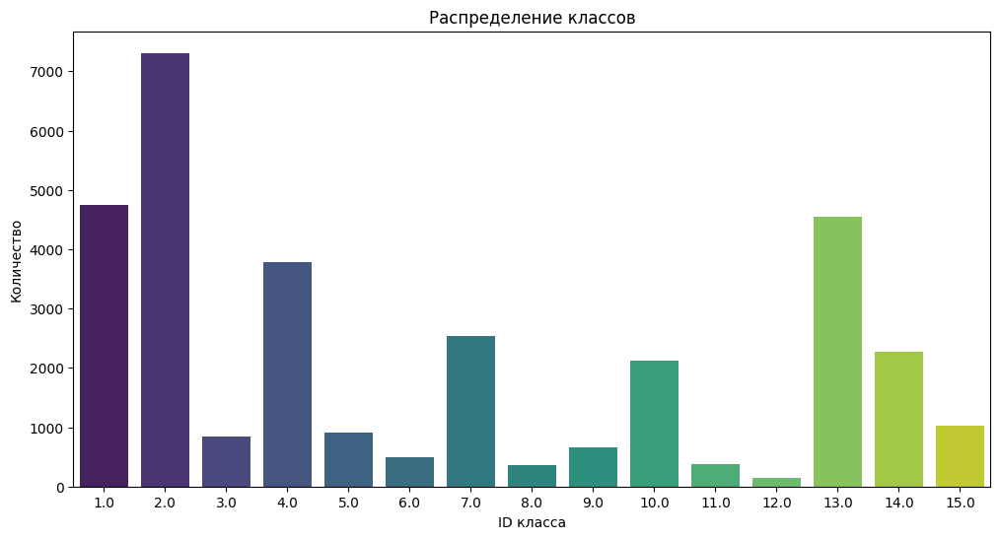

In [ ]:
# Построение графика
plt.figure(figsize=(12, 6))
sns.barplot(
    x=class_counts.index,
    y=class_counts.values,
    palette='viridis'
)
plt.title('Распределение классов')
plt.xlabel('ID класса')
plt.ylabel('Количество')
plt.show()

Наблюдается дисбаланс классов

## Предобработка данных



Подготовим данные для использования в модели.

### Разделение данных на тренировочную и валидационную выборки

In [ ]:
# Удаляем строки с пропущенными значениями
train_df_cleaned = train_df.dropna()

# Проверяем, удалились ли все пропуски
print(train_df_cleaned.isna().sum())

file_name      0
bbox           0
category_id    0
dtype: int64


In [ ]:
# Разделяем данные
X = train_df_cleaned['file_name']
y = train_df_cleaned['category_id']
groups = train_df_cleaned['file_name']

In [ ]:
# Инициализируем StratifiedGroupKFold
sgkf = StratifiedGroupKFold(n_splits=5, random_state=42, shuffle=True)

In [ ]:
# Стратифицированное разделение данных
# Берем первый фолд
for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups)):
    train_files = X.iloc[train_idx]
    val_files = X.iloc[val_idx]
    print(f'Fold {fold}:')
    print(f'  Train: {len(train_files)} файлов')
    print(f'  Validation: {len(val_files)} файлов')
    if fold == 0:  # Используем только первый фолд
        break

Fold 0:
  Train: 25796 файлов
  Validation: 6352 файлов


In [ ]:
# Фильтрация данных для тренировочной и валидационной выборки
train_images = train_df_cleaned[train_df_cleaned['file_name'].isin(train_files)]
val_images = train_df_cleaned[train_df_cleaned['file_name'].isin(val_files)]

# Вывод информации о полученных выборках
print(f'Тренировочная выборка: {len(train_images)} изображений')
print(f'Валидационная выборка: {len(val_images)} изображений')

Тренировочная выборка: 25796 изображений
Валидационная выборка: 6352 изображений


In [ ]:
train_images.head()

,file_name,bbox,category_id
0,000001.jpg,"[840.0, 0.0, 176.0, 124.0]",4.0
1,000001.jpg,"[612.0, 306.0, 383.0, 397.0]",2.0
2,000001.jpg,"[990.92, 551.0, 105.00000000000011, 186.0]",4.0
3,000002.jpg,"[1000.0, 614.0, 98.0, 178.0]",4.0
4,000002.jpg,"[605.0, 358.0, 402.0, 409.0]",2.0


In [ ]:
val_images.head()

,file_name,bbox,category_id
26,000011.jpg,"[999.0, 1150.0, 109.0, 175.0]",4.0
27,000011.jpg,"[618.0, 910.0, 374.0, 382.0]",2.0
28,000011.jpg,"[746.0, 142.0, 232.0, 539.0]",4.0
29,000011.jpg,"[686.0, 193.0, 169.0, 271.0]",10.0
79,000036.jpg,"[328.0, 160.0, 243.0, 454.0]",1.0


### Подготовка данных в формате Yolo

In [ ]:
# Применение функции к тренировочным данным
prepare_yolo_format(
    train_images,
    images_folder=os.path.join(PATH, 'yolo_data/train/images'),
    labels_folder=os.path.join(PATH, 'yolo_data/train/labels'),
    images_path=os.path.join(PATH0, 'images')
)

Обработка данных завершена. Файлы сохранены в /kaggle/working/yolo_data/train/images и /kaggle/working/yolo_data/train/labels.


Сравним данные до обработки и после

In [ ]:
# Папка с разметкой
labels_folder = os.path.join(PATH, 'yolo_data/train/labels')

# Получаем список всех .txt файлов в папке
label_files = [file for file in os.listdir(labels_folder) if file.endswith('.txt')]

# Выбираем случайный файл из списка
random_file = random.choice(label_files)

# Путь к выбранному файлу
file_path = os.path.join(labels_folder, random_file)

# Читаем и выводим содержимое файла
with open(file_path, 'r') as file:
    content = file.read()

# Выводим содержимое файла
print(f'Содержимое файла {random_file}:\n')
print(content if content else '(Пустой файл)')

# Получаем имя изображения, заменив расширение .txt на .jpg
image_name = random_file.replace('.txt', '.jpg')

# Получаем данные из train_df для этого изображения
file_data = train_df[train_df['file_name'] == image_name]

# Выводим соответствующие строки из train_df
print(f'\nДанные для изображения {image_name} из train_df:')
display(file_data)

Содержимое файла 001719.txt:

2 0.377197 0.801817 0.193848 0.374832
0 0.723389 0.349933 0.148926 0.080754
1 0.728516 0.924630 0.171875 0.149394
0 0.451660 0.585128 0.185547 0.286003

Данные для изображения 001719.jpg из train_df:


,file_name,bbox,category_id
4943,001719.jpg,"[574.0, 913.0, 397.0, 557.0]",3.0
4944,001719.jpg,"[1329.0, 460.0, 305.0, 120.0]",1.0
4945,001719.jpg,"[1316.0, 1263.0, 352.0, 222.0]",2.0
4946,001719.jpg,"[735.0, 657.0, 380.0, 425.0]",1.0


In [ ]:
# Список всех изображений в папке
image_files = [f for f in os.listdir(PATH + 'yolo_data/train/images') if f.endswith('.jpg')]

# Преобразуем аннотации YOLO в формат для отображения
yolo_annotations = yolo_to_annotations(
    labels_folder=PATH + 'yolo_data/train/labels',
    images_folder=PATH + 'yolo_data/train/images',
    image_names=image_files,
)

# Случайно выбираем изображения для отображения
np.random.seed(RANDOM_STATE)
np.random.shuffle(image_files)
selected_images = image_files[:9]  # Берём 9 изображений для отображения

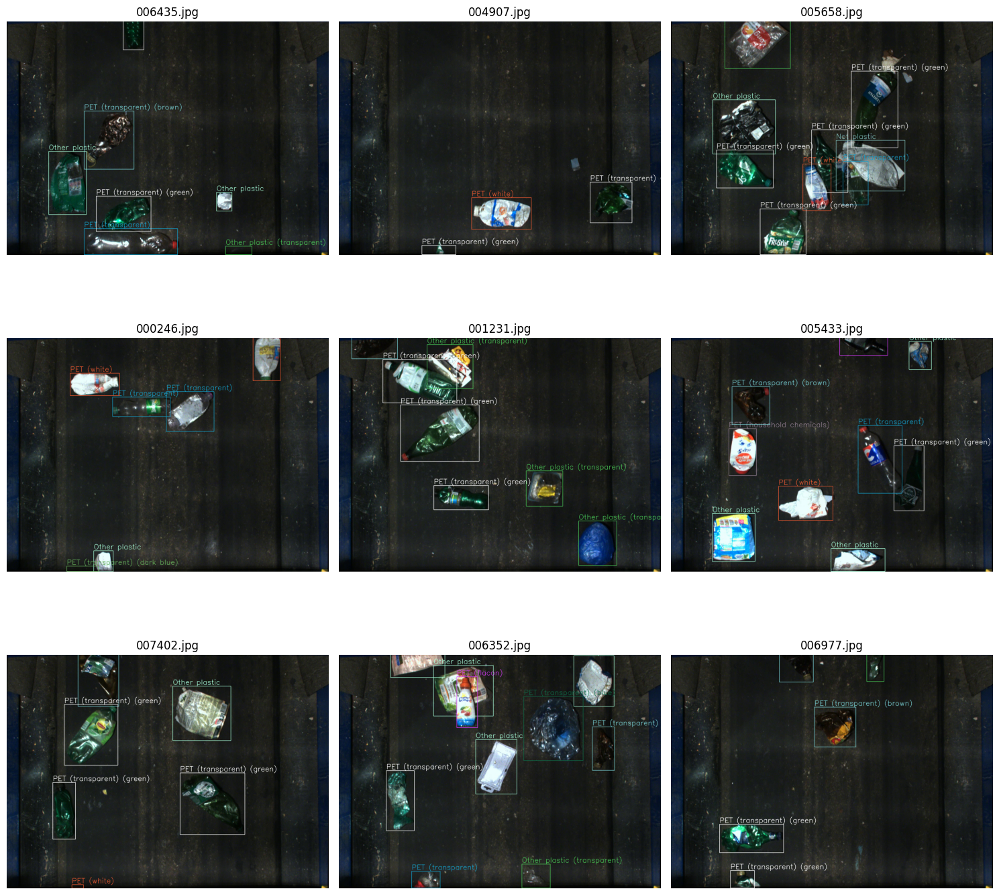

In [ ]:
# Отображаем изображения с аннотациями
display_images(
    image_paths=[os.path.join(PATH + 'yolo_data/train/images', img) for img in selected_images],
    annotations=yolo_annotations,
    grid_size=(3, 3),
    color_map=color_map,
    cli=0
)

In [ ]:
prepare_yolo_format(
    val_images,
    images_folder = PATH + 'yolo_data/val/images',
    labels_folder = PATH + 'yolo_data/val/labels',
    images_path = PATH0 + 'images/'
)

Обработка данных завершена. Файлы сохранены в /kaggle/working/yolo_data/val/images и /kaggle/working/yolo_data/val/labels.


## Обучим модель YOLO 11m

Запустим ClearML

In [ ]:
user_secrets = UserSecretsClient()
ACCESS_KEY = user_secrets.get_secret('CLEARML_API_ACCESS_KEY')
SECRET_KEY = user_secrets.get_secret('CLEARML_API_SECRET_KEY')
%env CLEARML_WEB_HOST=https://app.clear.ml/
%env CLEARML_API_HOST=https://api.clear.ml
%env CLEARML_FILES_HOST=https://files.clear.ml
%env CLEARML_API_ACCESS_KEY=ACCESS_KEY
%env CLEARML_API_SECRET_KEY=SECRET_KEY

In [ ]:
task = Task.init(project_name='Waste_Detection', task_name='Yolo11m')

ClearML Task: created new task id=1cf34ff9ebfc44e5aacf65da09b08025
2024-12-15 07:25:08,437 - clearml.Repository Detection - WARNING - Failed accessing the jupyter server(s): []
2024-12-15 07:25:08,474 - clearml.Task - INFO - No repository found, storing script code instead
ClearML results page: https://app.clear.ml/projects/09e0f466ae4d421d896ad485895df138/experiments/1cf34ff9ebfc44e5aacf65da09b08025/output/log


/opt/conda/lib/python3.10/site-packages/clearml/utilities/process/mp.py:629: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



Ранее была обучена модель `YOLO11n` (150 эпох) с предобученными весами, оптимизатором AdamW (lr=0.002→0.1, momentum=0.95). Изображения размером 864 пикселя, батч 128, применена аугментация.

**Результаты:**  
**Тренировочная выборка:**  
- **P:** 0.978, **R:** 0.908, **mAP@50:** 0.952, **mAP@50-95:** 0.857  

**Валидационная выборка:**  
- **P:** 0.975, **R:** 0.907, **mAP@50:** 0.953, **mAP@50-95:** 0.854  

**Тестовая выборка**
- **Среднее взвешенное по классам (weighted mean by class support):** [0.84379]('https://www.kaggle.com/competitions/waste-detection/leaderboard) (Private), [0.84991]('https://www.kaggle.com/competitions/waste-detection/leaderboard) (Public)

Модель показывает высокую точность (P), полноту (R), **mAP**, что подтверждает хорошее качество модели, но попробуем её улучшить. Для этого используем модель `YOLO11m`, изображения размером 1024 пикселя

Загрузим модель

In [ ]:
model = YOLO('yolo11m.pt')

100%|██████████| 38.8M/38.8M [00:00<00:00, 140MB/s]


2024-12-15 07:25:12,050 - clearml.model - INFO - Selected model id: 723055d474fe44c595dacc3e507ecdb2


In [ ]:
train_image_dir = PATH + 'yolo_data/train/images'
train_label_dir = PATH + 'yolo_data/train/labels'
val_image_dir = PATH + 'yolo_data/val/images'
val_label_dir = PATH + 'yolo_data/val/labels'

In [ ]:
# Создаем конфигурационный файл для обучения
training_config = {
    'train': [train_image_dir, train_label_dir],
    'val': [val_image_dir, val_label_dir],
    'nc': len(CL_NAMES),  # Количество классов
    'names': CL_NAMES,  # Имена классов
}

In [ ]:
# Сохраняем конфигурацию в файл
with open('data.yaml', 'w') as f:
    yaml.dump(training_config, f)

In [ ]:
# Параметры для обучения
training_params = {
    'epochs': 150,                # Количество эпох, за которые модель будет проходить полный набор данных для обучения
    'patience': 15,               # Количество эпох без улучшения метрики до остановки обучения (ранняя остановка)
    'batch': 16,                  # Размер батча, определяющий количество изображений, обрабатываемых за одну итерацию
    'imgsz': 1024,                # Размер изображений (ширина и высота), до которых будут приводиться все изображения
    'auto_augment': 'augmix',     # Стратегия автоматического увеличения данных для улучшения обучения ('augmix' использует комбинирование различных аугментаций)
    'seed': RANDOM_STATE,         # Значение для инициализации генератора случайных чисел (обеспечивает воспроизводимость результатов)
    'hsv_s': 0.5,                 # Значение насыщенности для цветового преобразования в HSV-пространстве (используется для увеличения данных)
    'project': 'waste_detection', # Папка для сохранения результатов
    'name': 'yolo11',             # Имя эксперимента
    'device': device,             # Устройство для обучения модели
}

In [ ]:
# Путь к файлу с конфигурацией данных
data_config = 'data.yaml'

Запустим обучение модели

In [ ]:
results = model.train(data=data_config, **training_params)

Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.pt, data=data.yaml, epochs=150, time=None, patience=15, batch=16, imgsz=1024, save=True, save_period=-1, cache=False, device=0,1, workers=8, project=waste_detection, name=yolo11, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=F

100%|██████████| 755k/755k [00:00<00:00, 21.6MB/s]


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytic

/opt/conda/lib/python3.10/site-packages/clearml/utilities/process/mp.py:629: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



TensorBoard: Start with 'tensorboard --logdir waste_detection/yolo11', view at http://localhost:6006/
Overriding model.yaml nc=80 with nc=15
Transferred 643/649 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 90.5MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/waste-detection-10-12-1/yolo_data/train/labels... 4706 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4706/4706 [00:27<00:00, 169.56it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/waste-detection-10-12-1/yolo_data/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

train: Scanning /kaggle/input/waste-detection-10-12-1/yolo_data/train/labels... 4706 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4706/4706 [00:05<00:00, 801.09it/s]
val: Scanning /kaggle/input/waste-detection-10-12-1/yolo_data/val/labels... 1178 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1178/1178 [00:08<00:00, 141.08it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/waste-detection-10-12-1/yolo_data/val is not writeable, cache not saved.
Plotting labels to waste_detection/yolo11/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 1024 train, 1024 val
Using 4 dataloader workers
Logging results to waste_detection/yolo11
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      11.2G      0.788      1.837      1.083          4       1024: 100%|██████████| 295/295 [03:56<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:32<00:00,  2.29it/s]


                   all       1178       6352      0.642      0.607      0.658      0.552

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150        11G     0.7298     0.9804      1.028          2       1024: 100%|██████████| 295/295 [04:04<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.646      0.681      0.706      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150        11G     0.7717     0.9295      1.048          5       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:32<00:00,  2.31it/s]


                   all       1178       6352      0.667      0.633      0.681      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150        11G     0.7963     0.9022      1.067          7       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.743      0.644      0.738      0.613

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150        11G     0.7786     0.8078      1.058          4       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.32it/s]


                   all       1178       6352      0.819      0.748      0.828      0.695

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150        11G      0.747      0.732      1.037          7       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.32it/s]


                   all       1178       6352      0.869      0.756      0.852      0.717

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150        11G     0.7359     0.6957      1.032          6       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.912      0.806      0.885      0.746

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150        11G     0.7215     0.6693      1.028          5       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.899      0.805      0.885      0.752

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150        11G     0.7116     0.6314      1.018         11       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.31it/s]


                   all       1178       6352      0.904      0.835      0.897      0.768

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150        11G     0.7056     0.6078      1.013          9       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.915      0.783      0.881      0.755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150        11G     0.6964     0.5913      1.015          1       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.31it/s]


                   all       1178       6352       0.91      0.815      0.895       0.77

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      11.1G     0.6899     0.5717      1.006          7       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.943      0.835      0.919      0.793

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      11.1G     0.6793     0.5513      1.006          9       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.32it/s]


                   all       1178       6352       0.93      0.826      0.891      0.767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150        11G     0.6623     0.5212      0.992          4       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.955      0.876      0.931      0.812

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150        11G     0.6636     0.5093     0.9902          9       1024: 100%|██████████| 295/295 [03:59<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.954      0.852       0.92      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150        11G     0.6606     0.5066     0.9992          3       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.967      0.853       0.93      0.812

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150        11G     0.6498     0.5004     0.9887         19       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.966       0.88      0.936       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      11.1G     0.6385     0.4899     0.9839         14       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.962      0.875      0.937      0.823

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150        11G     0.6304     0.4845     0.9822         13       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.966      0.862      0.933       0.82

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      11.1G      0.632     0.4683      0.983          6       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:32<00:00,  2.29it/s]


                   all       1178       6352      0.955      0.869      0.929      0.818

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      11.1G     0.6233     0.4589     0.9732         36       1024: 100%|██████████| 295/295 [03:59<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.971      0.882       0.94       0.83

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150        11G     0.6228     0.4554     0.9807         11       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.967      0.884       0.94      0.831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150        11G     0.6171     0.4495     0.9747          4       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.972      0.884      0.941      0.834

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150        11G     0.6114     0.4394     0.9697         11       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.959      0.884      0.939      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      11.1G     0.6102     0.4349     0.9779         17       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352       0.97      0.897      0.945      0.841

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150        11G     0.6006     0.4235     0.9699          3       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.977        0.9      0.948      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150        11G     0.5947     0.4228      0.968         13       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.977      0.889      0.945      0.844

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150        11G     0.5941     0.4195      0.967          6       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.975      0.896      0.946      0.847

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150        11G     0.5895      0.418     0.9603          5       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.977      0.893      0.946      0.848

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      11.1G     0.5815     0.4157     0.9577          9       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.976      0.898      0.945      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150        11G     0.5831     0.4054     0.9574         10       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352      0.966      0.898      0.945      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      11.1G     0.5707     0.4039     0.9518         17       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.977      0.894      0.949      0.852

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      10.9G      0.576     0.3946     0.9589          3       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.971      0.907      0.949      0.853

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150        11G     0.5742     0.3987     0.9545         12       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.976      0.895      0.949      0.855

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150        11G     0.5657      0.393     0.9531          2       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352       0.98      0.906      0.951      0.852

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      11.1G     0.5619     0.3897     0.9517         16       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.975      0.909       0.95      0.857

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150        11G     0.5552     0.3868     0.9459          4       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.977      0.908      0.953      0.857

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150        11G     0.5566     0.3911     0.9463         17       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.981      0.905      0.952      0.859

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150        11G     0.5546     0.3783     0.9456         11       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.976      0.903      0.952      0.861

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150        11G     0.5541     0.3788     0.9474         13       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352      0.965       0.91       0.95      0.858

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      11.1G     0.5514     0.3713     0.9467          5       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.974      0.905      0.948      0.858

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      11.1G     0.5413      0.367     0.9428          3       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.976      0.908       0.95      0.861

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      11.1G     0.5405     0.3734     0.9381          5       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352       0.98      0.917      0.955      0.868

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      11.1G     0.5403     0.3629     0.9409          9       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.984      0.912      0.954      0.864

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      11.1G     0.5302     0.3565     0.9393         15       1024: 100%|██████████| 295/295 [04:00<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.977      0.908      0.952      0.863

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150        11G     0.5448     0.3649     0.9494          1       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.979      0.918      0.954      0.866

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150        11G     0.5329     0.3571     0.9368         19       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.983      0.918      0.955      0.866

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150        11G     0.5363     0.3576     0.9404          6       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.985      0.912      0.954       0.87

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150        11G     0.5311      0.348     0.9363         28       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.986      0.921      0.956       0.87

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      11.1G     0.5247      0.352     0.9326         19       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.984      0.911      0.955      0.869

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      11.1G     0.5214     0.3499     0.9342          6       1024: 100%|██████████| 295/295 [04:00<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.975      0.915      0.955      0.869

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      11.1G     0.5234     0.3492     0.9334          6       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.983      0.909      0.955      0.868

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      11.1G     0.5172     0.3356     0.9332         14       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.984      0.917      0.955      0.872

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150        11G     0.5123      0.336      0.929          9       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.985      0.919      0.954       0.87

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150        11G     0.5134      0.336     0.9279          4       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.985      0.919      0.957      0.873

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      11.1G     0.5084     0.3338     0.9293          7       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.987      0.907      0.951       0.87

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150        11G     0.5058     0.3301      0.924         17       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352      0.981      0.919      0.958      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      11.1G     0.5129     0.3357     0.9309         16       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.985      0.916      0.956      0.874

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      11.1G     0.5021      0.336     0.9248         24       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.982      0.917      0.957      0.876

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150        11G     0.5041     0.3312     0.9245          7       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352       0.98      0.917      0.957      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150        11G     0.5013     0.3297      0.922          8       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.32it/s]


                   all       1178       6352      0.985      0.918      0.957      0.874

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150        11G     0.4972     0.3268     0.9243          4       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.984      0.918      0.956      0.875

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150        11G     0.5006     0.3294     0.9238         17       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.984      0.921      0.959      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150        11G     0.4994     0.3255     0.9245          5       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.982      0.922       0.96      0.877

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      11.1G     0.4972     0.3264     0.9248         11       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.37it/s]


                   all       1178       6352      0.981      0.924      0.959      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150        11G     0.4969     0.3227     0.9181         11       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.982      0.925      0.959       0.88

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150        11G     0.4906      0.317     0.9148          3       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.978      0.926      0.959      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      11.1G     0.4872     0.3167     0.9189          2       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.984      0.921      0.959      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150        11G     0.4794     0.3126     0.9135          5       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352      0.986      0.922      0.961      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150        11G     0.4817     0.3109     0.9144          6       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.32it/s]


                   all       1178       6352      0.983      0.926      0.961      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150        11G     0.4705     0.3048     0.9083         18       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352       0.98      0.924      0.963      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      11.1G      0.474     0.3066     0.9099          6       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.984      0.921      0.961      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      11.1G      0.471     0.3032     0.9095         20       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.988      0.922       0.96      0.885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      11.1G     0.4662     0.3001     0.9064         10       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.987       0.92      0.961      0.881

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150        11G     0.4748     0.3047      0.915         14       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.986      0.924       0.96      0.881

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      11.1G     0.4666     0.3008     0.9096          9       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.983      0.923      0.963      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150        11G     0.4646     0.2993     0.9049          4       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.32it/s]


                   all       1178       6352       0.98      0.925       0.96       0.88

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150        11G     0.4687     0.2993     0.9092          6       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.978      0.932       0.96      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150        11G     0.4646     0.2931     0.9113          7       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.984      0.922      0.958      0.879

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      11.1G     0.4642     0.2943     0.9052          9       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352      0.984      0.927      0.958       0.88

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150        11G     0.4608     0.2946     0.9112         10       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.984      0.922      0.959      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150        11G     0.4564     0.2908     0.9053          3       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.987      0.923      0.959      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150        11G      0.457     0.2895     0.9047          6       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.986      0.929      0.961      0.885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      11.1G     0.4502     0.2913     0.9037         12       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.984      0.921       0.96      0.885

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150        11G     0.4502     0.2867     0.9025          6       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.986      0.921      0.959      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      11.1G     0.4482     0.2842     0.8985          4       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.984      0.923      0.958      0.882

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150        11G     0.4583     0.2871     0.9034          7       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.979      0.928      0.959      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150        11G     0.4402     0.2843     0.8954          6       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.986      0.921      0.959      0.883

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      11.1G     0.4442     0.2804      0.899         15       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.981      0.926       0.96      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      11.1G     0.4463      0.281     0.9032          6       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.983      0.925      0.958      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150        11G     0.4406     0.2802     0.8939          6       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.983      0.924       0.96      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150        11G     0.4384     0.2733     0.8971         10       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.985      0.922      0.959      0.884

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150        11G     0.4349     0.2768     0.8998         10       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.988      0.922       0.96      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      11.1G     0.4335     0.2751     0.8928          3       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.983      0.931       0.96      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150        11G     0.4339     0.2693     0.8964          5       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.986      0.924       0.96      0.886

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150        11G     0.4292     0.2677     0.8923          7       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352       0.99      0.926      0.962      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      11.1G     0.4287     0.2701     0.8907         12       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.983      0.932      0.961      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150        11G     0.4303     0.2674      0.892         13       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.37it/s]


                   all       1178       6352      0.983      0.934      0.961      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      11.1G     0.4195     0.2627     0.8906         19       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.991      0.925      0.962      0.889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150        11G     0.4262     0.2633     0.8935          5       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.989      0.924       0.96      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      11.1G     0.4163     0.2608     0.8861         12       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.989      0.925       0.96      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150        11G     0.4137     0.2595     0.8886         10       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.35it/s]


                   all       1178       6352      0.981      0.929       0.96      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150        11G      0.412      0.257     0.8855          6       1024: 100%|██████████| 295/295 [04:02<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352       0.99      0.919      0.959      0.887

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150        11G     0.4137     0.2557     0.8875          8       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.986      0.925      0.959      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150        11G     0.4102     0.2571     0.8851          8       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.987      0.924       0.96      0.889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150        11G     0.4047     0.2524     0.8831          5       1024: 100%|██████████| 295/295 [04:02<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.985      0.922       0.96      0.889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150        11G     0.4102     0.2589     0.8838          8       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.988      0.923       0.96      0.889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150        11G     0.4072     0.2537     0.8853          3       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.985      0.928       0.96      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150        11G     0.3995     0.2544     0.8825         11       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.988      0.923       0.96      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      11.1G      0.399     0.2474     0.8812          6       1024: 100%|██████████| 295/295 [04:02<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.992      0.923       0.96      0.889

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150        11G     0.3955     0.2463     0.8797          4       1024: 100%|██████████| 295/295 [04:03<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.992      0.923       0.96      0.888

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150        11G     0.3978     0.2491     0.8839         12       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.988      0.926      0.961      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150        11G     0.3974      0.246     0.8789         21       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.32it/s]


                   all       1178       6352      0.988      0.925      0.961      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      11.1G     0.3858     0.2443     0.8785         22       1024: 100%|██████████| 295/295 [04:03<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.989      0.923       0.96      0.892

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150        11G     0.3927     0.2444     0.8783         20       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.986      0.926      0.961      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      11.1G     0.3904     0.2412     0.8774          5       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.987      0.929      0.961      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150        11G     0.3846     0.2403      0.876         11       1024: 100%|██████████| 295/295 [04:01<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.982      0.931      0.961      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      11.1G     0.3856     0.2386     0.8764         24       1024: 100%|██████████| 295/295 [04:03<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.989      0.928      0.962       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150        11G     0.3839     0.2393     0.8739          4       1024: 100%|██████████| 295/295 [04:03<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.986       0.93      0.962       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150        11G     0.3801     0.2348     0.8786          3       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.987      0.929      0.961       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      11.1G     0.3756      0.232     0.8692         16       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.987       0.93      0.962      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      11.1G     0.3735     0.2309     0.8701          6       1024: 100%|██████████| 295/295 [04:02<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.988      0.928      0.961       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150        11G     0.3755     0.2315     0.8788         17       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352       0.99      0.927      0.961       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      11.1G     0.3695      0.229     0.8737          3       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.988      0.928      0.961       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150        11G     0.3693     0.2313     0.8718          8       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352      0.986      0.929      0.961       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150        11G     0.3717     0.2304     0.8711          4       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.34it/s]


                   all       1178       6352      0.987       0.93      0.962       0.89

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150        11G     0.3675     0.2265     0.8681         19       1024: 100%|██████████| 295/295 [04:03<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:33<00:00,  2.19it/s]


                   all       1178       6352      0.988       0.93      0.961      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      11.1G     0.3652     0.2239       0.87          7       1024: 100%|██████████| 295/295 [04:02<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.36it/s]


                   all       1178       6352      0.988      0.929      0.962      0.891

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      11.1G     0.3615     0.2214     0.8683          9       1024: 100%|██████████| 295/295 [04:03<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:31<00:00,  2.33it/s]


                   all       1178       6352      0.989      0.929      0.962      0.891
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 114, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

129 epochs completed in 9.837 hours.
Optimizer stripped from waste_detection/yolo11/weights/last.pt, 40.6MB
Optimizer stripped from waste_detection/yolo11/weights/best.pt, 40.6MB

Validating waste_detection/yolo11/weights/best.pt...
Ultralytics 8.3.49 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
                                                 CUDA:1 (Tesla T4, 15095MiB)
YOLO11m summary (fused): 303 layers, 20,041,597 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 74/74 [00:32<00:00,  2.30it/s]


                   all       1178       6352      0.989      0.923       0.96      0.892
PET (transparent) (green)        671        941      0.996      0.954      0.981      0.908
PET (transparent) (brown)        784       1428      0.996      0.934      0.971      0.902
PET (transparent) (blue)        165        172          1       0.89      0.964      0.876
     PET (transparent)        537        746      0.988      0.925      0.967      0.879
PET (transparent) (dark blue)        186        201      0.989      0.909      0.952      0.892
           PET (black)         86         88      0.988       0.96      0.968      0.904
           PET (white)        424        521      0.995      0.929      0.962      0.908
         PET (sticker)         57         60      0.997        0.9      0.935      0.842
          PET (flacon)        121        137          1      0.907      0.953      0.903
PET (household chemicals)        350        430      0.991      0.905       0.96      0.904
PND

██████████████████████████████▉ 100% | 38.71/38.71 MB [00:01<00:00, 34.83MB/s]: 


2024-12-15 17:17:50,691 - clearml.Task - INFO - Completed model upload to https://files.clear.ml/Waste_Detection/Yolo11m.1cf34ff9ebfc44e5aacf65da09b08025/models/best.pt


## Показатели работы модели

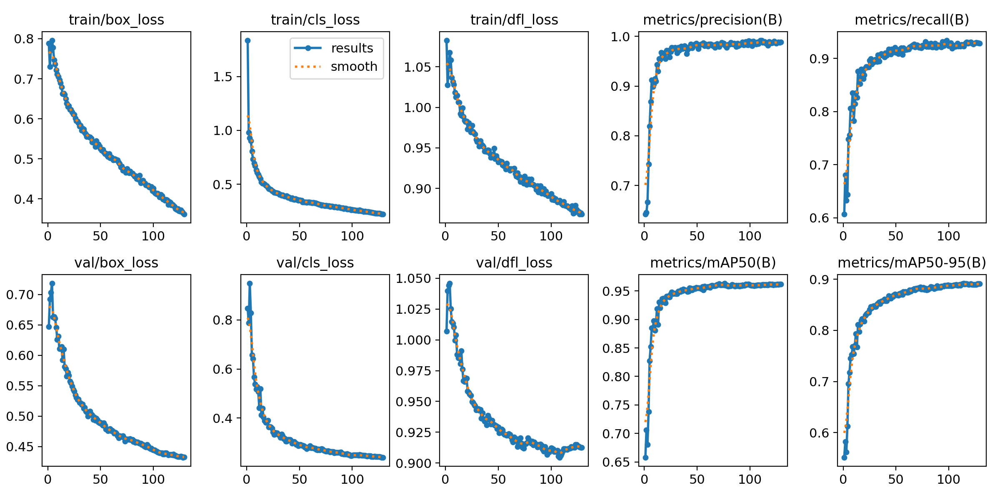

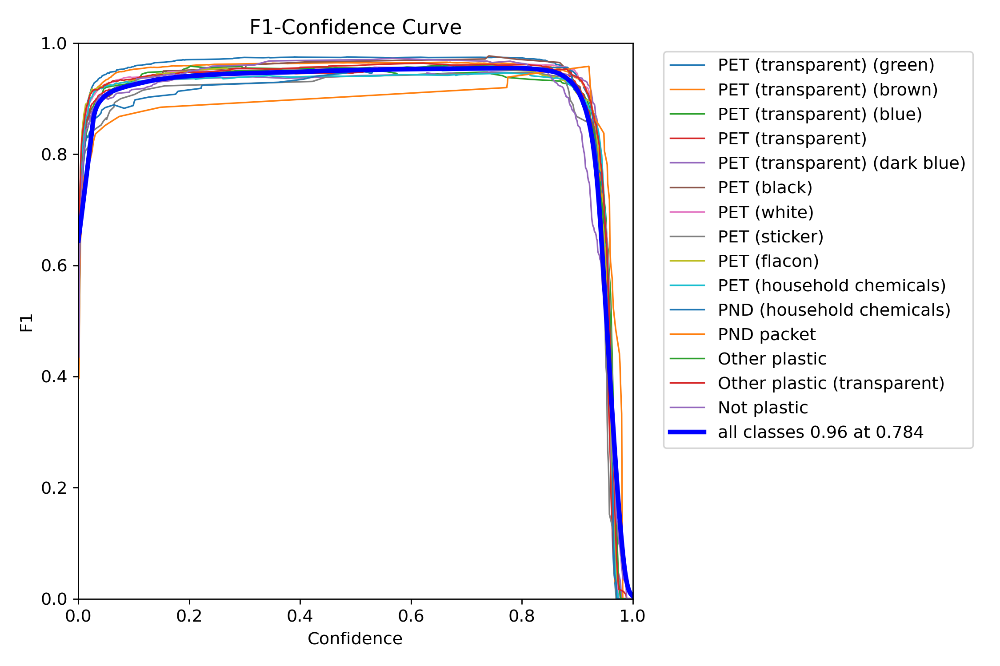

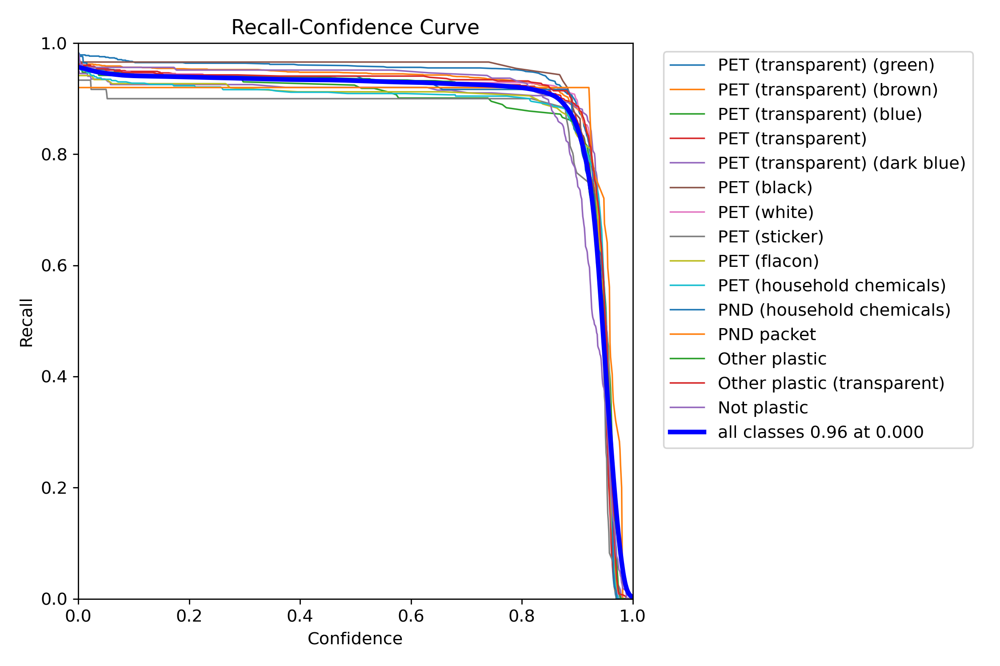

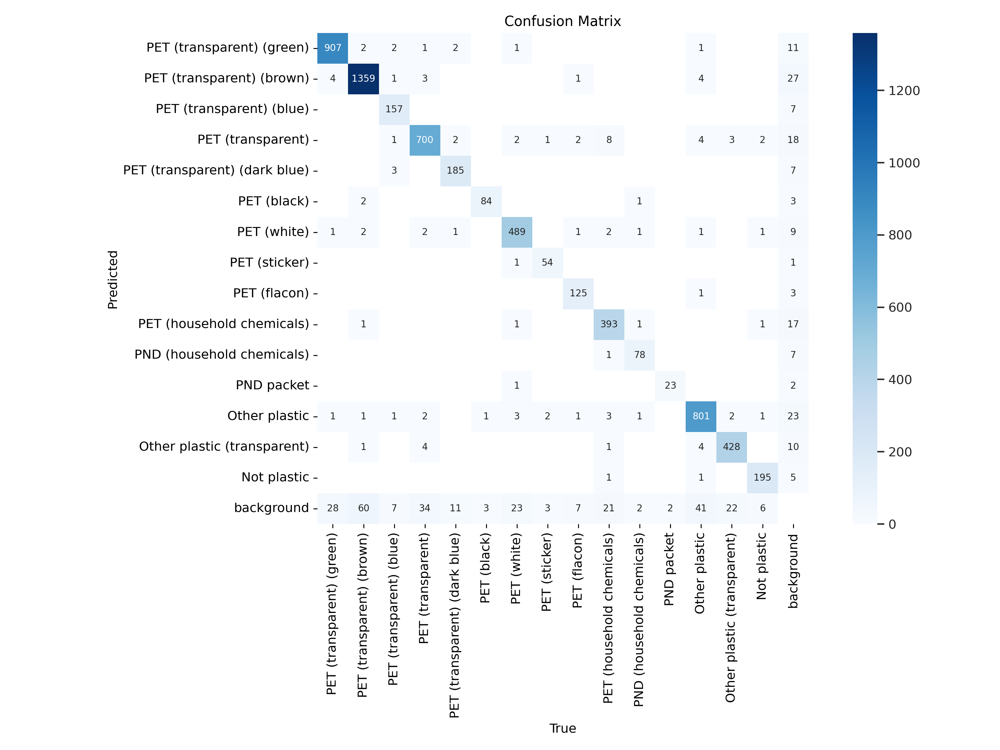

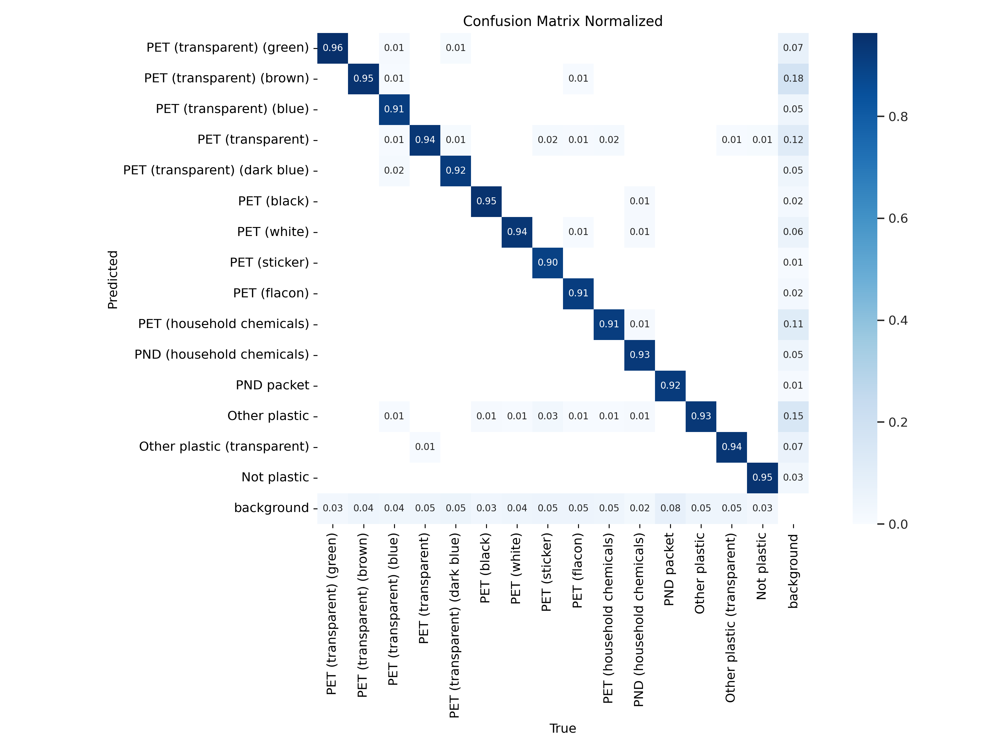

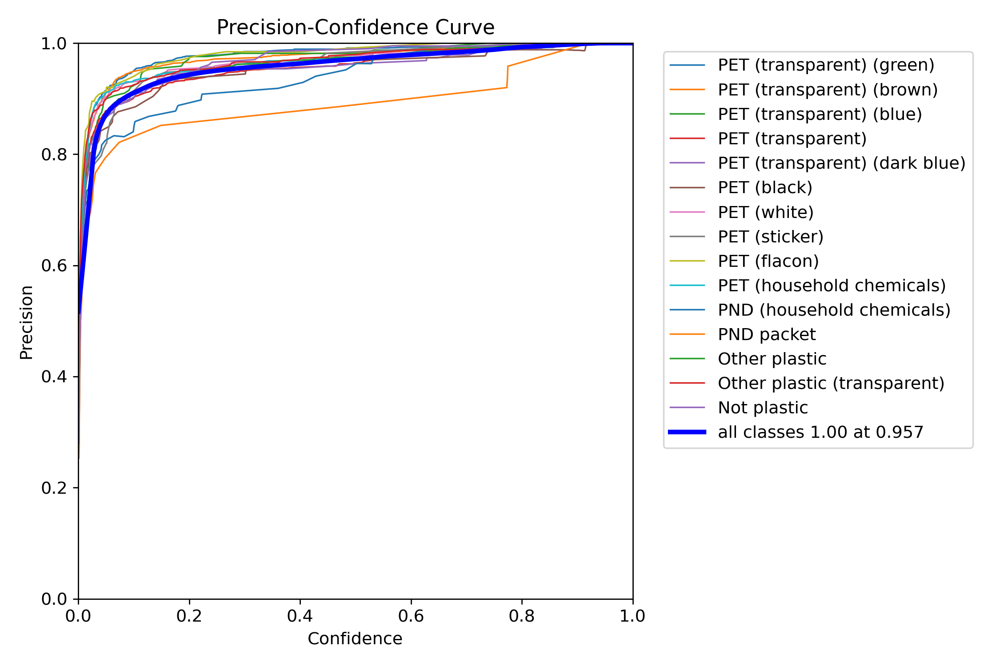

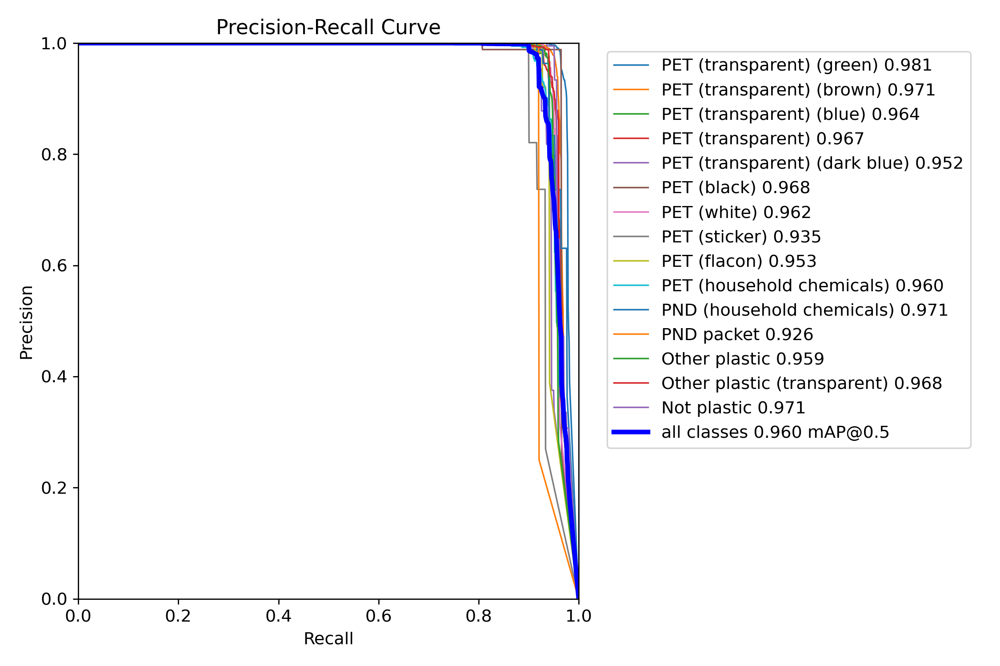

In [ ]:
info_paths = glob.glob(PATH+'yolo11/*.png')
for info_path in info_paths:
    display(IPImage(filename=info_path))

Примеры детекции объектов моделью

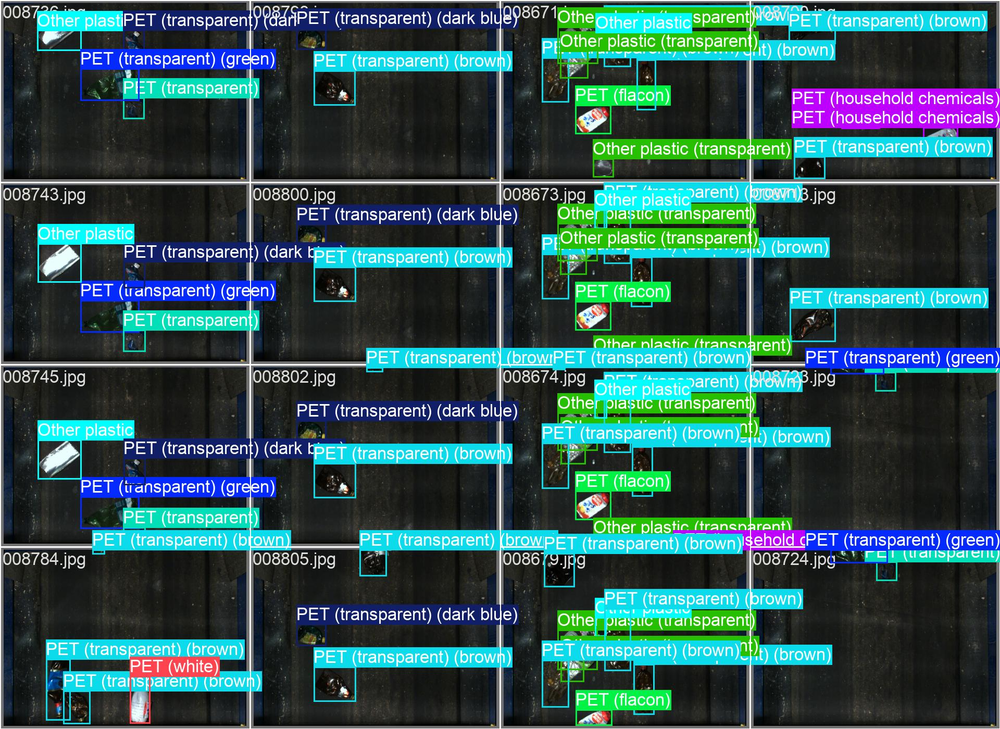

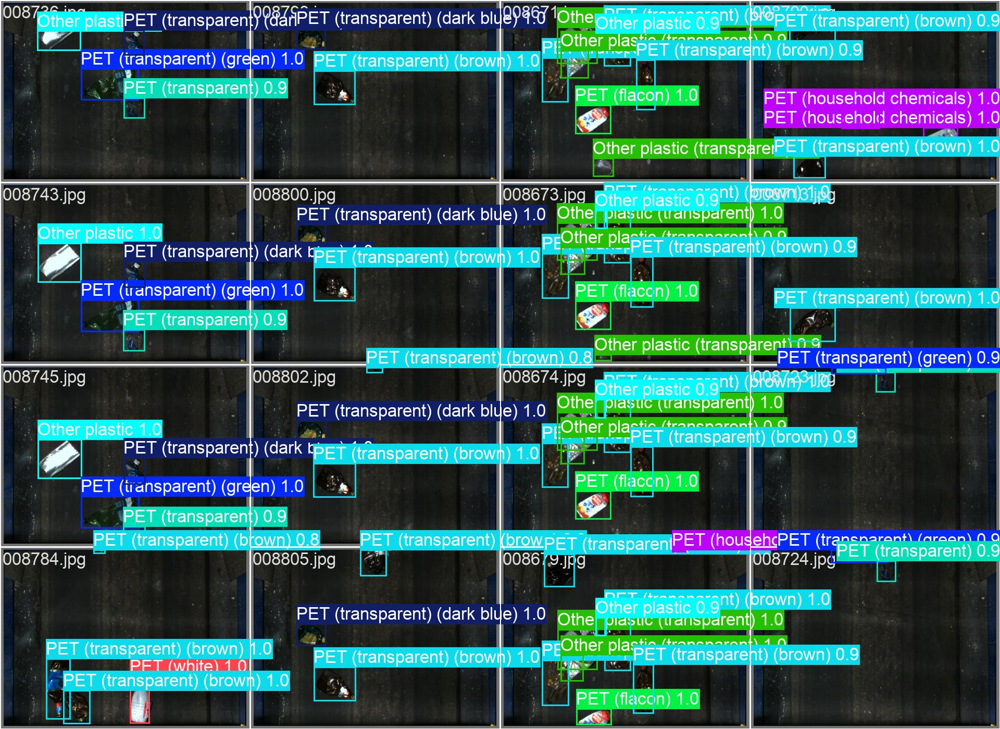

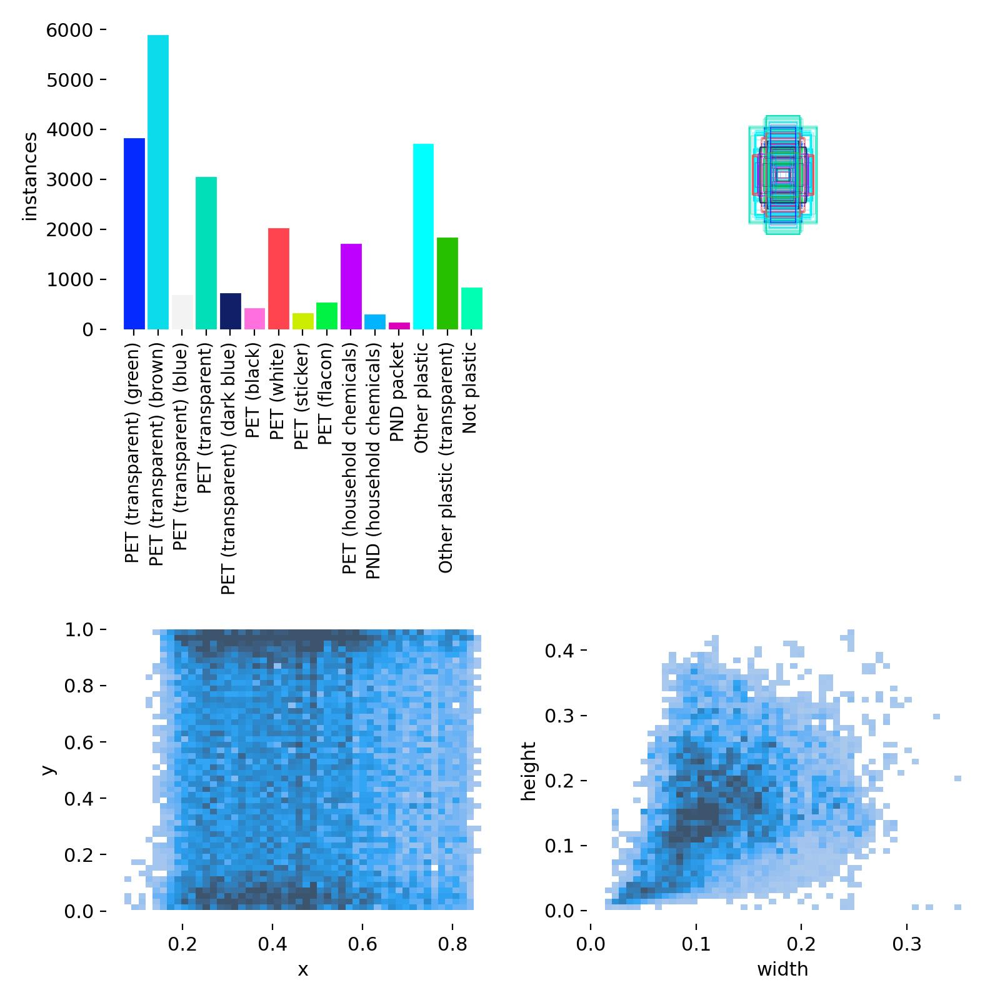

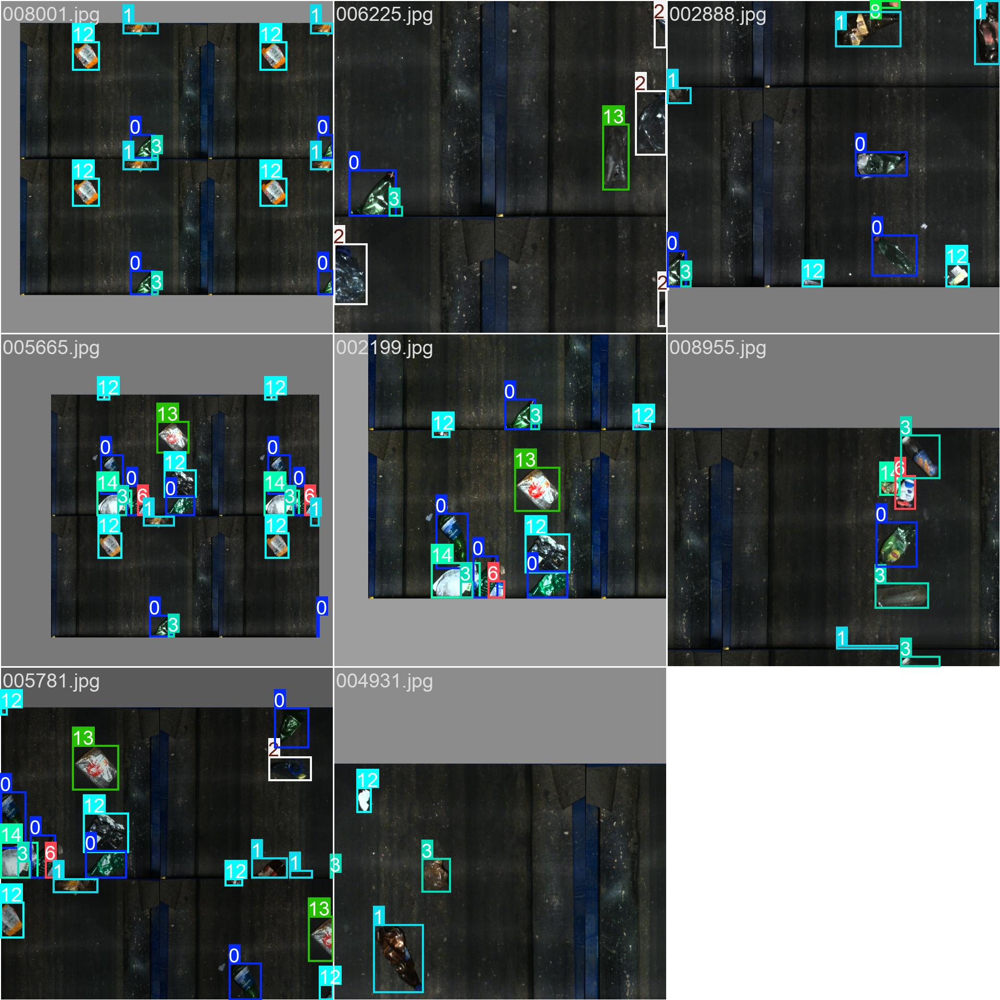

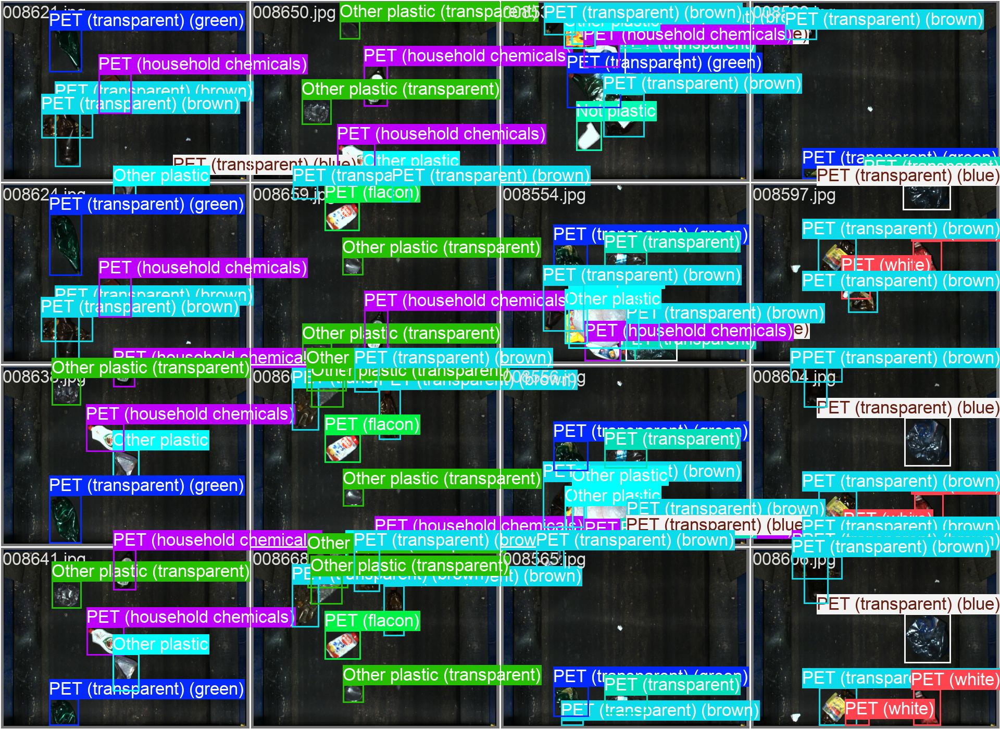

...

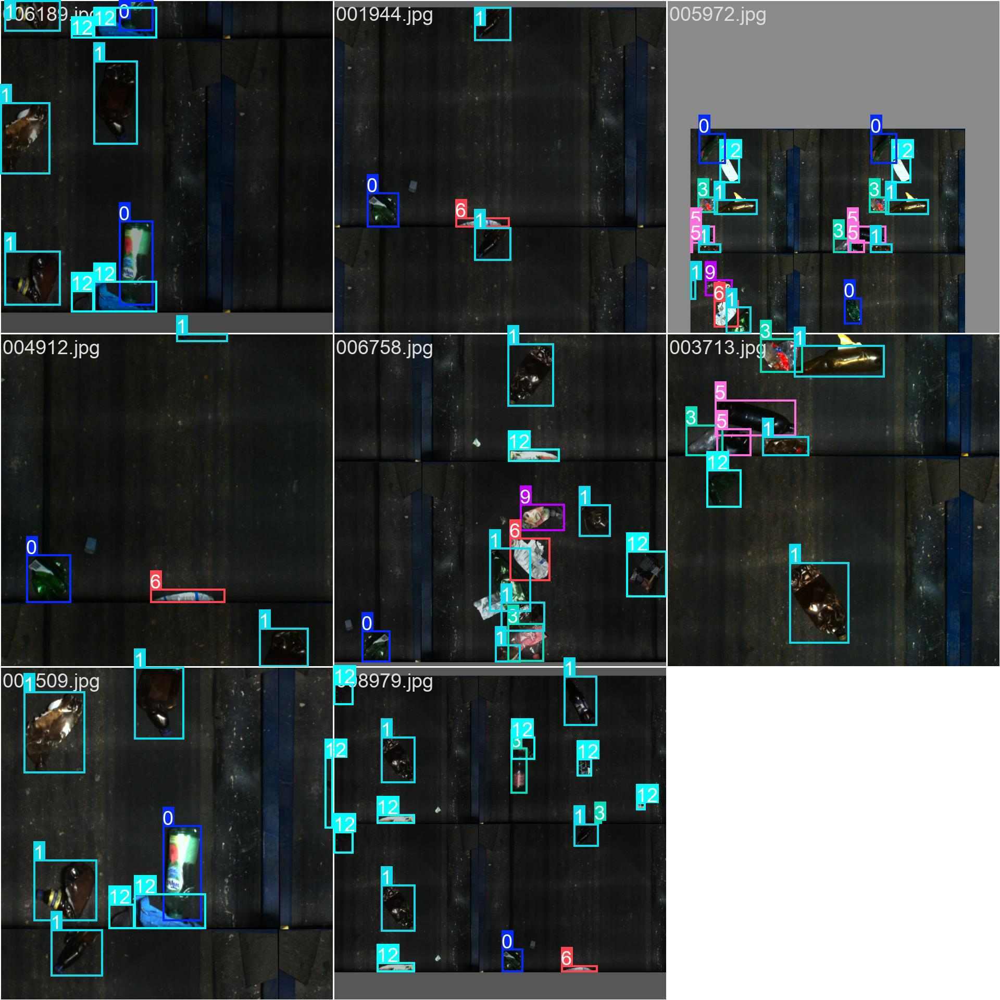

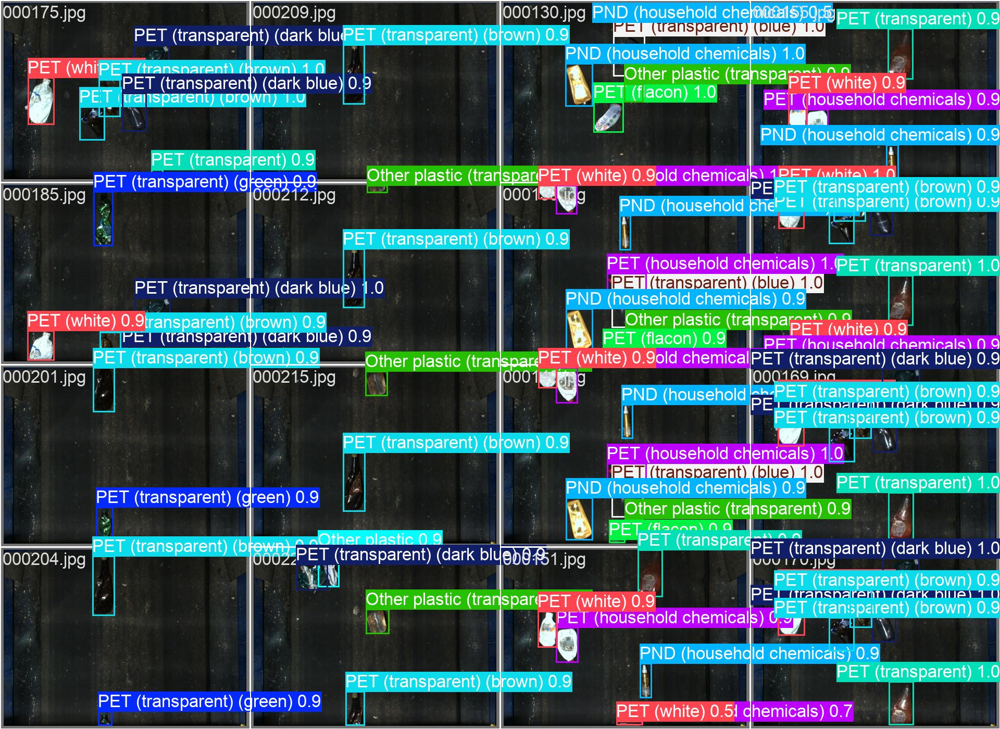

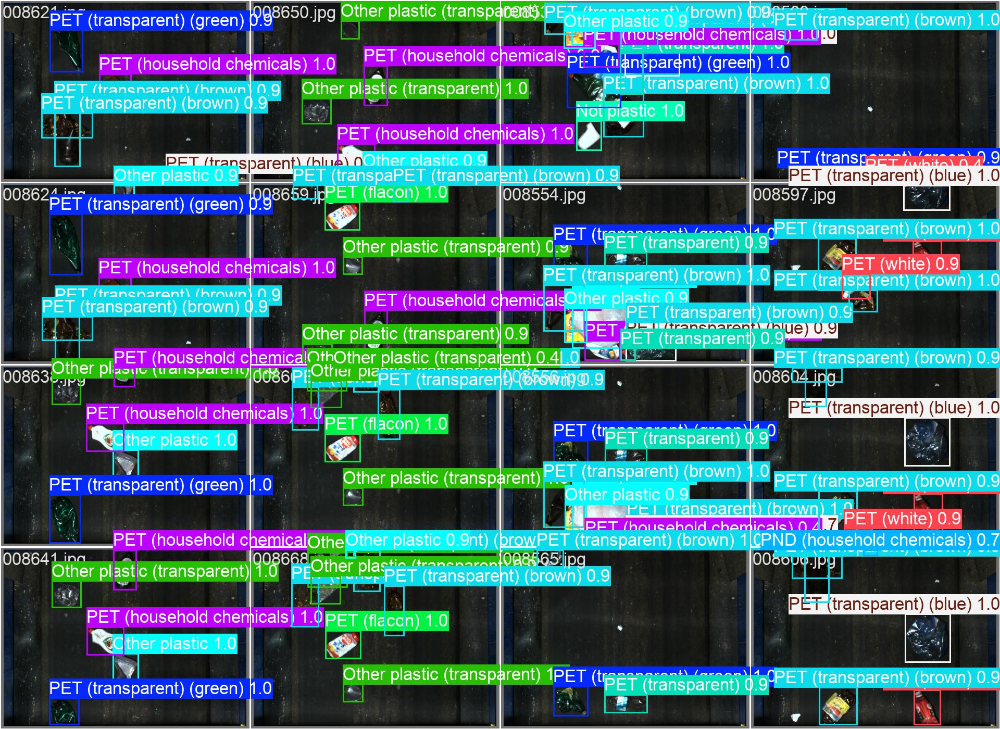

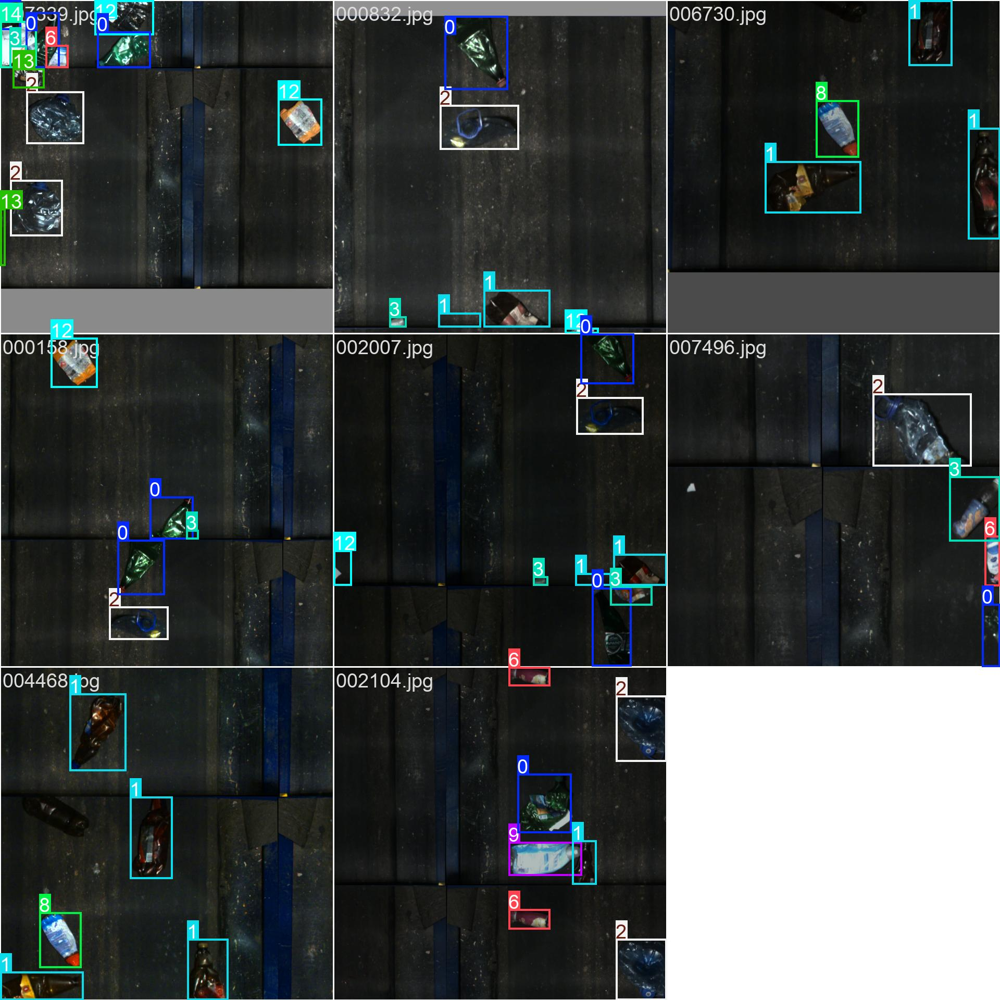

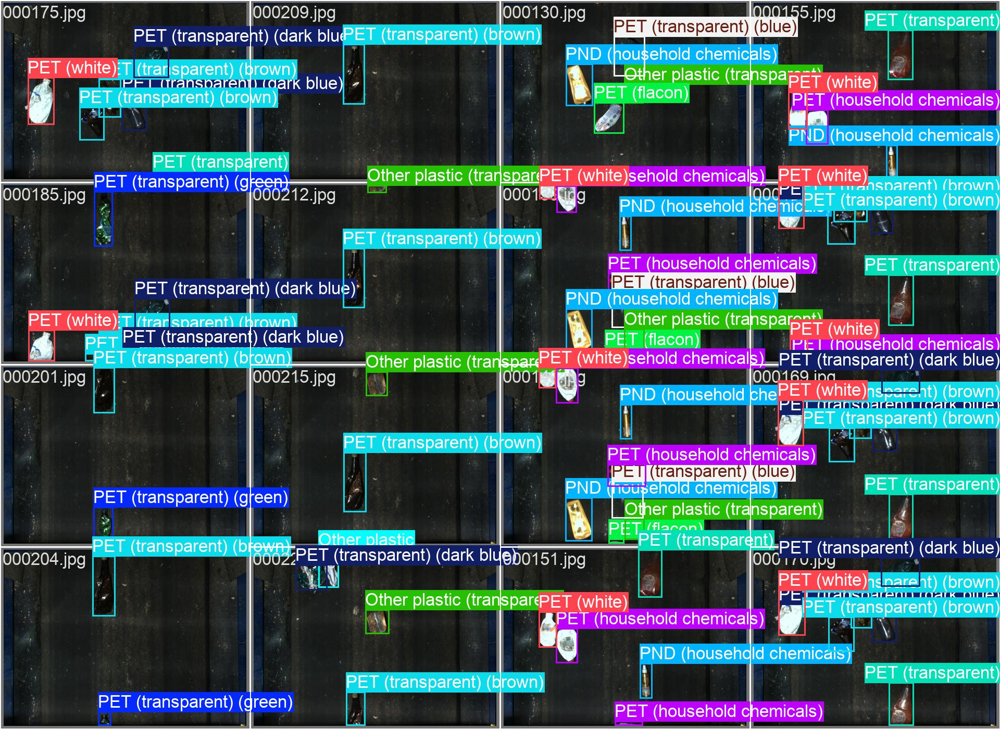

In [ ]:
info_paths = glob.glob(PATH+'yolo11/*.jpg')
for info_path in info_paths:
    display(IPImage(filename=info_path))

## Проверим модель на тестовых данных

Загрузим лучшую модель

In [ ]:
model = YOLO(PATH + '/waste_detection/yolo11/weights/best.pt')

In [ ]:
# Список путей к изображениям тестового набора
test_image_paths = [os.path.join(image_dir, file_name) for file_name in test_df['file_name']]

In [ ]:
# Результирующий словарь
formatted_predictions = defaultdict(list)

In [ ]:
for image_path in test_image_paths:
    results = model(image_path)
    for result in results:
        for box in result.boxes:
            x_min, y_min, x_max, y_max = box.xyxy[0].tolist()
            confidence = box.conf[0].item()
            category_id = int(box.cls[0].item())  # Класс объекта +1
            width = x_max - x_min
            height = y_max - y_min

            file_name = os.path.basename(image_path)
            formatted_predictions[file_name].append([
                float(category_id)+1,  # Класс объекта
                round(confidence, 2),  # Уверенность
                round(x_min, 2),  # x_left
                round(y_min, 2),  # y_top
                round(width, 2),  # width
                round(height, 2)  # height
            ])


image 1/1 /kaggle/input/waste-detection/images/000003.jpg: 768x1024 1 PET (transparent) (brown), 2 PET (transparent)s, 2158.8ms
Speed: 21.8ms preprocess, 2158.8ms inference, 19.1ms postprocess per image at shape (1, 3, 768, 1024)

image 1/1 /kaggle/input/waste-detection/images/000006.jpg: 768x1024 1 PET (transparent) (brown), 2 PET (transparent)s, 1814.7ms
Speed: 5.7ms preprocess, 1814.7ms inference, 1.4ms postprocess per image at shape (1, 3, 768, 1024)

image 1/1 /kaggle/input/waste-detection/images/000013.jpg: 768x1024 1 PET (transparent) (brown), 2 PET (transparent)s, 1 PET (household chemicals), 1817.6ms
Speed: 5.8ms preprocess, 1817.6ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1024)

image 1/1 /kaggle/input/waste-detection/images/000016.jpg: 768x1024 1 PET (transparent) (brown), 2 PET (transparent)s, 1 PET (household chemicals), 1869.7ms
Speed: 5.7ms preprocess, 1869.7ms inference, 1.5ms postprocess per image at shape (1, 3, 768, 1024)

image 1/1 /kaggle/input

In [ ]:
# Создадим список для DataFrame
submission_data = []

In [ ]:
for file_name, objects in formatted_predictions.items():
    # Преобразуем список объектов в строку
    objects_str = str(objects)
    submission_data.append({'file_name': file_name, 'predictions': objects_str})

In [ ]:
# Преобразуем в DataFrame
submission_df = pd.DataFrame(submission_data)

In [ ]:
# Убедимся, что все изображения из тестового набора включены, даже если предсказания пустые
all_files = set(test_df['file_name'])
predicted_files = set(submission_df['file_name'])
missing_files = all_files - predicted_files

In [ ]:
for file_name in missing_files:
    submission_df = pd.concat([submission_df, pd.DataFrame([{'file_name': file_name, 'predictions': '[]'}])])

In [ ]:
# Сортируем строки по file_name, чтобы сохранить порядок
submission_df = submission_df.sort_values(by='file_name').reset_index(drop=True)

In [ ]:
# Сохраняем в CSV
submission_df.to_csv('submission.csv', index=False)
print('Файл submission.csv успешно создан!')

Файл submission.csv успешно создан!


In [ ]:
# Проверяем первые строки файла
submission_sample = pd.read_csv('submission.csv')
print(submission_sample.head())

    file_name                                        predictions
0  000003.jpg  [[2.0, 0.96, 616.67, 427.65, 375.78, 387.76], ...
1  000006.jpg  [[2.0, 0.96, 618.68, 609.04, 374.23, 385.35], ...
2  000013.jpg  [[2.0, 0.96, 618.16, 1026.97, 375.46, 387.59],...
3  000016.jpg  [[4.0, 0.94, 821.38, 458.73, 242.0, 557.94], [...
4  000019.jpg  [[10.0, 0.94, 727.35, 947.01, 174.46, 281.71],...


## Вывод

В ходе выполнения проекта по обнаружению мусора был реализован подход на основе моделей семейства **YOLOv11**. Были исследованы и обучены две модели: **YOLO11n** (начальная версия) и более мощная **YOLO11m**, с целью повышения точности распознавания объектов на изображениях и улучшения других ключевых метрик.  

---

### Этапы выполнения:  
1. **Подготовка данных:**  
   - Для обучения использовались размеченные изображения с метками классов, что обеспечивало возможность обучения моделей с учётом специфики задачи.  
   - Валидационная выборка использовалась для мониторинга качества модели на независимых данных, предотвращая переобучение.  

2. **Обучение первой модели — YOLO11n:**  
   - **Гиперпараметры:**  
     - Предобученные веса.  
     - Оптимизатор: AdamW (lr=0.002→0.1, momentum=0.95).  
     - Размер изображений: 864 пикселя, батч: 128.  
     - Аугментация для увеличения разнообразия тренировочных данных.  
   - **Результаты:**  
     **Тренировочная выборка:**  
     - **Precision (P):** 0.978  
     - **Recall (R):** 0.908  
     - **mAP@50:** 0.952  
     - **mAP@50-95:** 0.857  
     **Валидационная выборка:**  
     - **Precision (P):** 0.975  
     - **Recall (R):** 0.907  
     - **mAP@50:** 0.953  
     - **mAP@50-95:** 0.854  
   - Несмотря на высокие результаты, модель ограничена размером входных изображений и архитектурой, что оставляло потенциал для улучшения.  

3. **Обучение улучшенной модели — YOLO11m:**  
   - **Гиперпараметры:**  
     - Предобученные веса.  
     - Оптимизатор: AdamW.  
     - Размер изображений: 1024 пикселя, батч: 16.  
     - Использована аугментация **AugMix** и преобразование HSV.  
     - Ранняя остановка при отсутствии улучшения метрик (patience=15).  
   - **Результаты:**  
     - Обучение завершено за 129 эпох (остановлено досрочно).  
     - **Тренировочная выборка:**  
       - **mAP@50:** 0.962  
       - **mAP@50-95:** 0.891  
     - **Валидационная выборка:**  
       - **mAP@50:** 0.960  
       - **mAP@50-95:** 0.892  

4. **Тестовая выборка:**  
   - **YOLO11n:**  
     - Средневзвешенная точность: [0.84379 (Private)](https://www.kaggle.com/competitions/waste-detection/leaderboard), [0.84991 (Public)](https://www.kaggle.com/competitions/waste-detection/leaderboard).  
   - **YOLO11m:**  
     - Средневзвешенная точность: [0.87161 (Private)](https://www.kaggle.com/competitions/waste-detection/leaderboard), [0.87995 (Public)](https://www.kaggle.com/competitions/waste-detection/leaderboard).  

---

### Выводы:  
1. **YOLO11n** продемонстрировала высокие метрики точности и полноты, но дальнейшее улучшение стало возможным благодаря использованию более мощной модели **YOLO11m**, увеличенного размера изображений и других настроек.  
2. **YOLO11m** превзошла результаты первой модели по ключевым метрикам, показав более точное и устойчивое распознавание на тестовых данных.  
3. Оценка качества на тестовой выборке подтвердила, что улучшение гиперпараметров, увеличение разрешения изображений и архитектурные изменения положительно влияют на производительность модели.  

---

### Рекомендации:  
Для дальнейшего повышения качества модели можно:  
- Увеличить объём тренировочных данных.  
- Исследовать дополнительные стратегии аугментации.  
- Рассмотреть использование других моделей, автоподбора гиперпараметров

---

Таким образом, проект продемонстрировал успешное применение методов глубокого обучения для решения задачи автоматического обнаружения пластикового мусора различного класса, с возможностью дальнейшего улучшения модели для более широкого применения в реальных условиях.